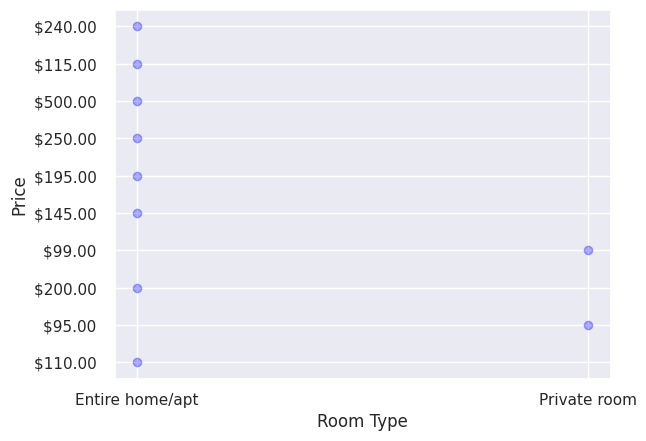

In [6]:
#importing the required packages
import pandas as pd
import seaborn as sns 
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import rc
import plotly.express as px
import altair as alt

%matplotlib inline

#using Bayesian Methods for Hackers to style the graphs
plt.style.use('bmh')

df = pd.read_csv('https://raw.githubusercontent.com/ct0571/visualization/main/airbnb.csv')

#Optimizing the size of the data
n = 10
x = df['room_type'].tolist()
#creating the new x, y1  variable to assign the data till n records by using index method
new_x = x[:n] 
y1 = df['price'].tolist()
new_y1 = y1[:n]


#styling the plot with seaborn
import seaborn as sns
sns.set_theme()

#plot the graph by providing color and line width
plt.scatter(new_x, new_y1, c='blue', alpha=0.3, linewidth=1)

#Adding labels to the x and y axis
plt.xlabel('Room Type')
plt.ylabel('Price')

#show the graph
plt.show()

In [11]:

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 608 entries, 0 to 607
Data columns (total 66 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   id                           608 non-null    int64  
 1   listing_url                  608 non-null    object 
 2   name                         607 non-null    object 
 3   experiences_offered          608 non-null    object 
 4   picture_url                  608 non-null    object 
 5   host_id                      608 non-null    int64  
 6   host_url                     608 non-null    object 
 7   host_name                    608 non-null    object 
 8   host_since                   608 non-null    object 
 9   host_location                608 non-null    object 
 10  host_is_superhost            608 non-null    object 
 11  host_picture_url             608 non-null    object 
 12  host_listings_count          608 non-null    int64  
 13  host_total_listings_

In [ ]:
c = alt.Chart(df).mark_arc().encode(
    theta='count(id)',
    color='is_location_exact:N',
tooltip=['is_location_exact', 'count(id)'])
c

alt.Chart(...)

In [ ]:


host = alt.Chart(df).mark_bar().encode(
    x='property_type:O',
    y='count(id):Q',
    color='host_identity_verified:N',
    #column='site:N'
)
host.display()

alt.Chart(...)

<ipython-input-12-f8937379c646>:19: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  for key, grp in grouped_df.groupby(['room_type']):


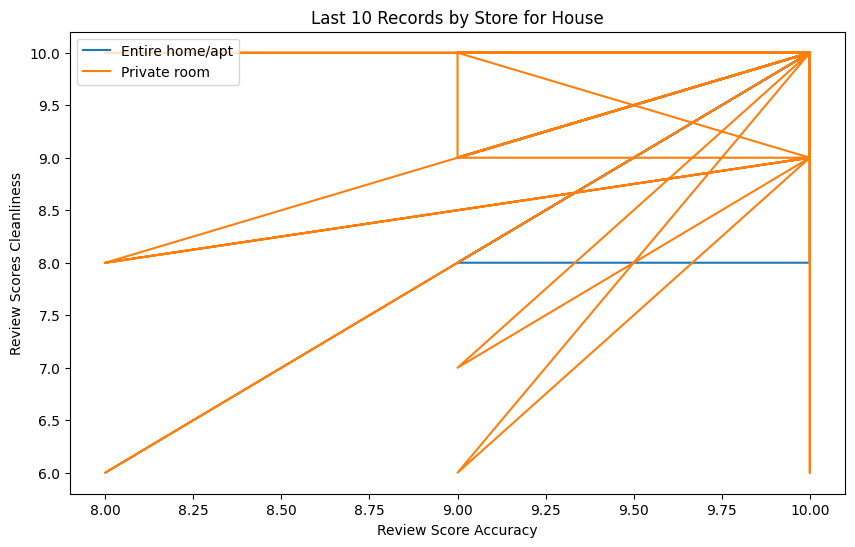

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# load the data into a pandas dataframe
df = pd.read_csv('https://raw.githubusercontent.com/ct0571/visualization/main/airbnb.csv')

# group the data by country, store, and date, and select the last 10 records


# select the desired country
propertyType = 'House'
df = df[df['property_type'] == propertyType]

# group the data by store and date, and select the last 10 records
grouped_df = df.groupby(['host_identity_verified', 'number_of_reviews']).tail(5)

# plot the data using matplotlib
fig, ax = plt.subplots(figsize=(10, 6))
for key, grp in grouped_df.groupby(['room_type']):
    ax = grp.plot(ax=ax, kind='line', x='review_scores_accuracy', y='review_scores_cleanliness', label=key)
plt.title(f'Last 10 Records by Store for {propertyType}')
plt.xlabel('Review Score Accuracy')
plt.ylabel('Review Scores Cleanliness')
plt.legend(loc='best')
plt.show()

In [1]:
import altair as alt 
import folium 
import pandas as pd
location = 'https://raw.githubusercontent.com/ct0571/visualization/main/airbnb.csv'

airbnb_loc = pd.read_csv(location)
# Define the map location and zoom level
map = folium.Map(location=[airbnb_loc['latitude'].mean(), airbnb_loc['longitude'].mean()], zoom_start=12)


# Adding markers to the map
for index, location_info in airbnb_loc.iterrows():
  folium.Marker([location_info['latitude'], location_info['longitude']], popup=[location_info['price'], location_info['property_type'], location_info['room_type']]).add_to(map)

# displaying the map with markers
map

In [ ]:
import altair as alt
import seaborn as sns

df = pd.read_csv('https://raw.githubusercontent.com/ct0571/visualization/main/airbnb.csv')

alt.Chart(df).mark_line().encode(
    alt.X('count(price)'),
    alt.Y('property_type'),
    alt.Color('room_type')
    )

alt.Chart(...)

In [2]:
import folium
import altair as alt
import pandas as pd

# reading the dataset
source = pd.read_csv('https://raw.githubusercontent.com/ct0571/visualization/main/airbnb.csv')

# create an altair chart, then convert to JSON
chart = alt.Chart(source).mark_bar().encode(x='number_of_reviews', y='property_type')
vis1 = chart.to_json()


#creating a map
start_coords = [42.360, -71.068]
folium_map = folium.Map(
    location=start_coords,
    zoom_start=13,
    width='80%',
    height='80%',
)


# create a marker, with altair graphic as popup
circ_mkr = folium.CircleMarker(
    location=start_coords,
    radius=20,
    color='red',
    fill=True,
    fill_color='red',
    fillOpacity=1.0,
    opacity=1.0,
    tooltip='Altair Graph',
    popup=folium.Popup(max_width=400).add_child(folium.VegaLite(vis1, width=400, height=300)),
)

# add to map
circ_mkr.add_to(folium_map)

folium_map
